In [56]:
import os
import trimesh
import yaml
import numpy as np
import cv2
import torch

from PIL import Image

import nvdiffrast.torch as dr

from sam2_instantmesh import *

import pickle

In [57]:
DIR = os.path.join('make_instantmeshes/', 'AP10')
meta_file = os.path.join(DIR, '0000.pkl')
K = pickle.load(open(meta_file,'rb'))['camMat']
print(K)

[[614.627   0.    320.262]
 [  0.    614.101 238.469]
 [  0.      0.      1.   ]]


In [58]:
'''
006_mustard_bottle
021_bleach_cleanser
019_pitcher_base
010_potted_meat_can
'''

'\n006_mustard_bottle\n021_bleach_cleanser\n019_pitcher_base\n010_potted_meat_can\n'

In [59]:
glctx = dr.RasterizeCudaContext()

save_path ="demo_data/light_ho3d/make_anchors/019_pitcher_base"

depth_scale = 1000.0
color0 = cv2.cvtColor(cv2.imread(os.path.join(save_path, 'color.png')), cv2.COLOR_BGR2RGB)
depth0 = cv2.imread(os.path.join(save_path, 'depth.png'), cv2.IMREAD_ANYDEPTH).astype(np.float32) / depth_scale
mask0 = cv2.cvtColor(cv2.imread(os.path.join(save_path, 'mask.png')),cv2.COLOR_BGR2RGB)[...,0].astype(np.bool_)

In [60]:
import imageio
import glob

color_files = glob.glob(f"{DIR}/0000.jpg")
color = imageio.imread(color_files[0])[...,:3]

depth_scale = 0.00012498664727900177
depth = cv2.imread(f"{DIR}/0000.png", -1)
depth = (depth[...,2]+depth[...,1]*256)*depth_scale

mask = cv2.imread(f"{DIR}/00000.png", -1)

/tmp/ipykernel_1238410/2565105941.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  color = imageio.imread(color_files[0])[...,:3]


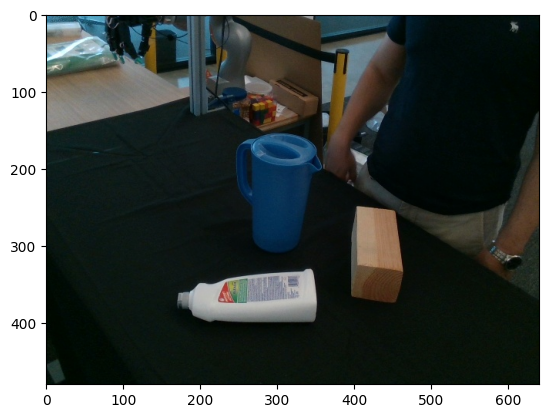

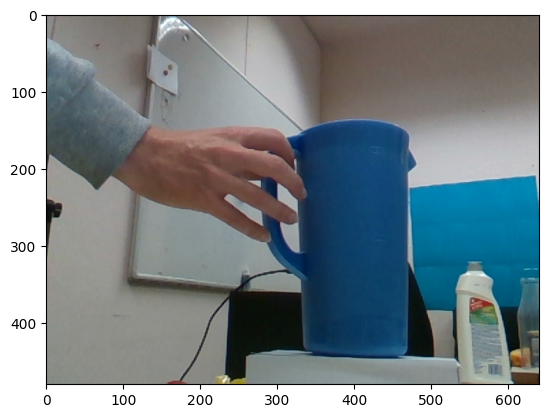

In [61]:
import matplotlib.pyplot as plt
plt.imshow(color0)
plt.show()
plt.imshow(color)
plt.show()

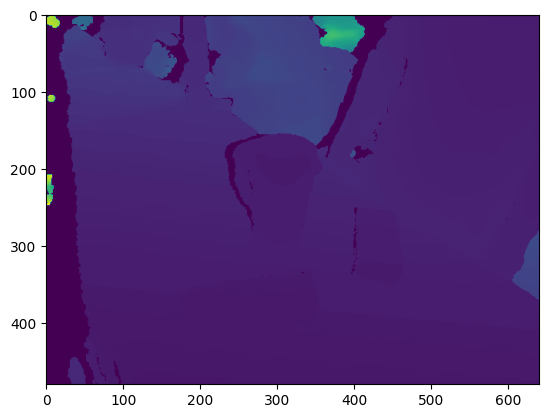

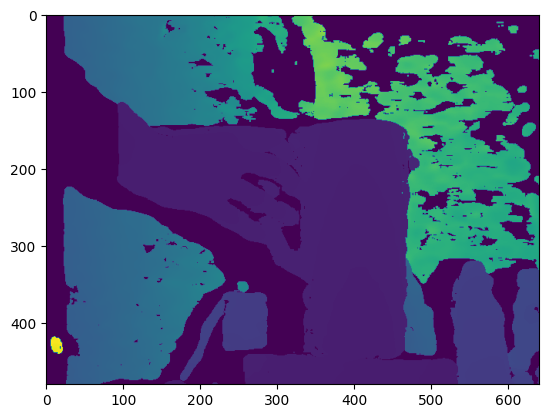

In [62]:
import matplotlib.pyplot as plt
plt.imshow(depth0)
plt.show()
plt.imshow(depth)
plt.show()

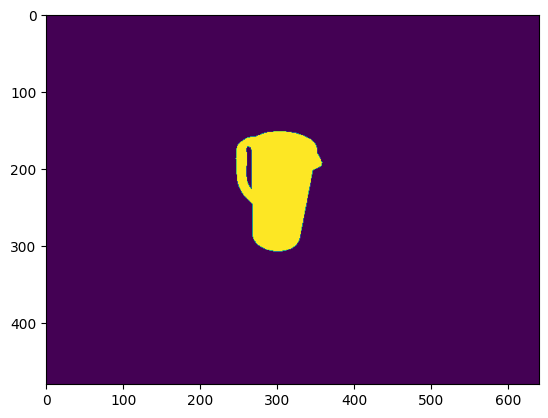

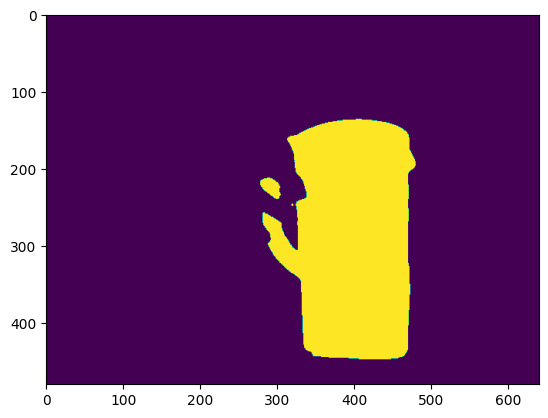

In [63]:
import matplotlib.pyplot as plt
plt.imshow(mask0)
plt.show()
plt.imshow(mask)
plt.show()

In [64]:
cmin, rmin, cmax, rmax = get_bounding_box(mask).astype(np.int32)
input_box = np.array([cmin, rmin, cmax, rmax])[None, :]
mask_refine = running_sam_box(color, input_box)

In [65]:
#preprocess image

input_image = color.copy()
input_image[mask == False] = [255, 255, 255]

# Remove background and resize
rem_bg = True
if rem_bg:
    rembg_session = rembg.new_session()
    input_image = remove_background(Image.fromarray(input_image), rembg_session)

flip=True
if flip:
    input_image = input_image.transpose(Image.FLIP_LEFT_RIGHT)

input_image = resize_foreground(input_image.convert("RGBA"), 0.80)


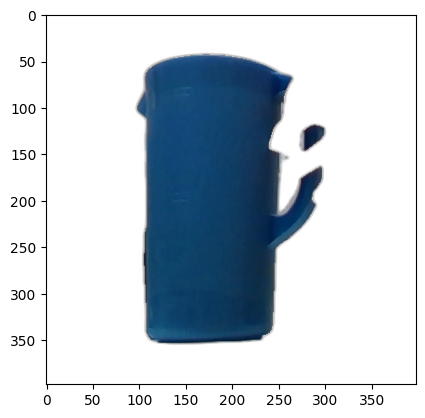

In [66]:
plt.imshow(input_image)

In [67]:
config_path = "./instantmesh/configs/instant-mesh-large.yaml"

config = OmegaConf.load(config_path)

device = torch.device('cuda')
print('Loading diffusion model ...')
multiview_diffusion_model = DiffusionPipeline.from_pretrained("sudo-ai/zero123plus-v1.2", custom_pipeline="instantmesh/zero123plus", torch_dtype=torch.float16)
multiview_diffusion_model.scheduler = EulerAncestralDiscreteScheduler.from_config(multiview_diffusion_model.scheduler.config, timestep_spacing='trailing')

# load custom white-background UNet
print('Loading custom white-background unet ...')
state_dict = torch.load(config.infer_config.unet_path, map_location='cpu', weights_only=True)
multiview_diffusion_model.unet.load_state_dict(state_dict, strict=True)
multiview_diffusion_model = multiview_diffusion_model.to(device)

Loading diffusion model ...


Loading pipeline components...:   0%|          | 0/8 [00:00<?, ?it/s]

Loading custom white-background unet ...


In [68]:
output_image = multiview_diffusion_model(input_image, num_inference_steps=75, ).images[0]
output_image.save(os.path.join(DIR, f'6_views.png'))
print(f"Image saved to {os.path.join(DIR, f'6_views.png')}")

images = np.asarray(output_image, dtype=np.float32) / 255.0
images = torch.from_numpy(images).permute(2, 0, 1).contiguous().float()  # (3, 960, 640)
images = rearrange(images, 'c (n h) (m w) -> (n m) c h w', n=3, m=2)  # (6, 3, 320, 320)

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/AP10/6_views.png


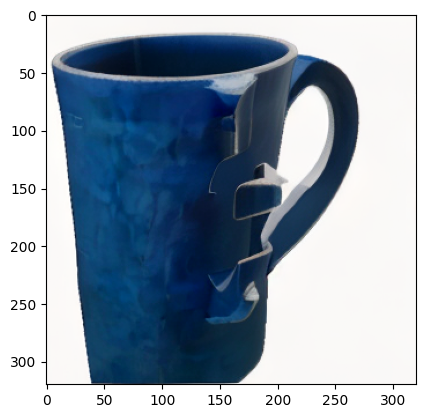

In [77]:
plt.imshow(images[0].permute(1,2,0).cpu().numpy())

In [78]:
IS_FLEXICUBES = True

instant_mesh = instantiate_from_config(config.model_config)
model_ckpt_path = config.infer_config.model_path
state_dict = torch.load(model_ckpt_path, weights_only=True)['state_dict']
state_dict = {k[14:]: v for k, v in state_dict.items() if k.startswith('lrm_generator.')}
instant_mesh.load_state_dict(state_dict, strict=True)

instant_mesh = instant_mesh.to(device)
instant_mesh.init_flexicubes_geometry(device, fovy=30.0)
instant_mesh = instant_mesh.eval()

images = images.unsqueeze(0).to(device)
images = torchvision.transforms.functional.resize(images, 320, interpolation=3, antialias=True).clamp(0, 1)

input_cameras = get_zero123plus_input_cameras(batch_size=1, radius=4.0 * 1.0).to(device)
chunk_size = 5 if IS_FLEXICUBES else 1
with torch.no_grad():
    planes = instant_mesh.forward_planes(images, input_cameras)
    mesh_path_idx = os.path.join(DIR, f'mesh.obj')

    mesh_out = instant_mesh.extract_mesh(planes, use_texture_map=False, **config.infer_config, )
    vertices, faces, vertex_colors = mesh_out
    save_obj(vertices, faces, vertex_colors, mesh_path_idx)
    print(f"Mesh saved to {mesh_path_idx}")

del instant_mesh

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/AP10/mesh.obj


In [80]:
mesh = trimesh.load(os.path.join(DIR, f'mesh.obj'))
mesh.show(viewer='notebook')


Processing folder: AP12

[[615.411   0.    310.501]
 [  0.    614.584 238.798]
 [  0.      0.      1.   ]] 



/tmp/ipykernel_1238410/2553693672.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  color = imageio.imread(color_files[0])[...,:3]


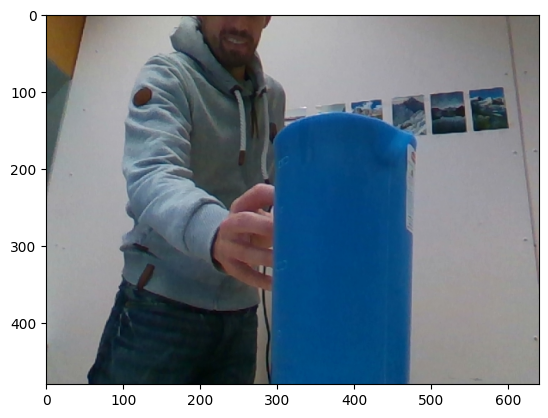

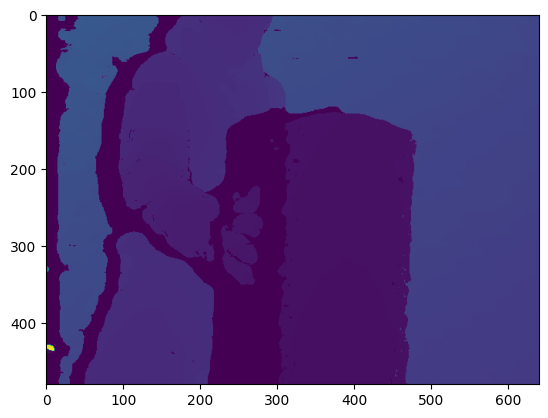

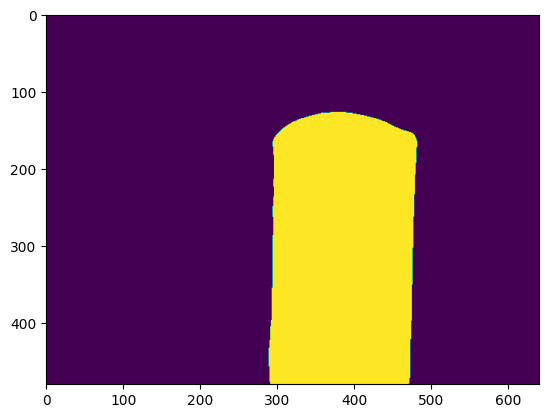

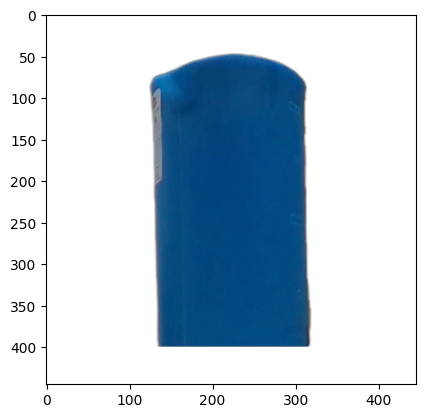

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/AP12/6_views.png


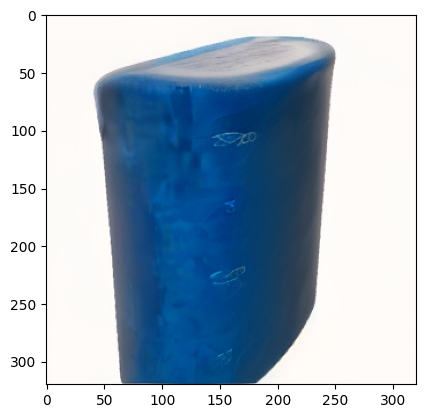

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/AP12/mesh.obj

Processing folder: AP13

[[615.635   0.    332.178]
 [  0.    615.31  231.754]
 [  0.      0.      1.   ]] 



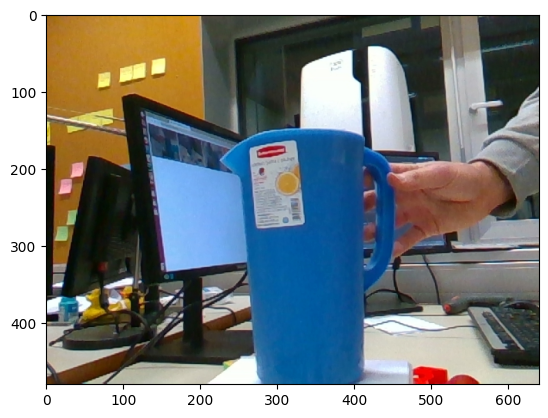

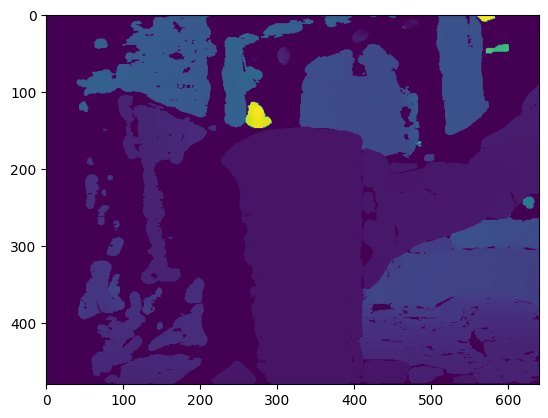

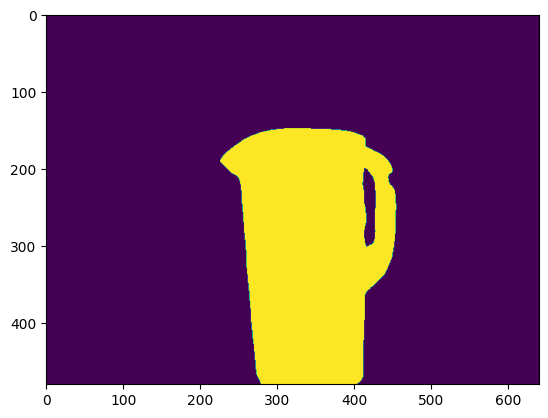

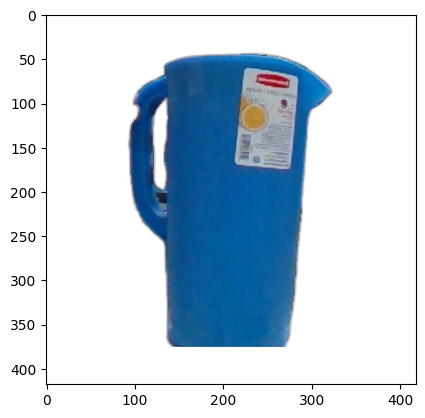

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/AP13/6_views.png


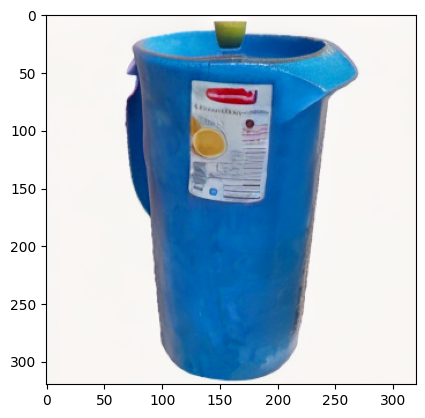

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/AP13/mesh.obj

Processing folder: AP14

[[617.042   0.    315.726]
 [  0.    616.693 245.485]
 [  0.      0.      1.   ]] 



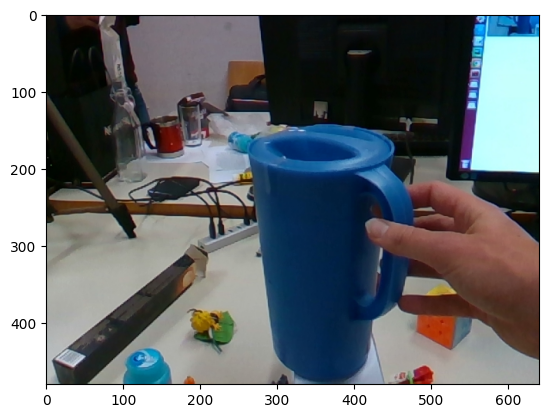

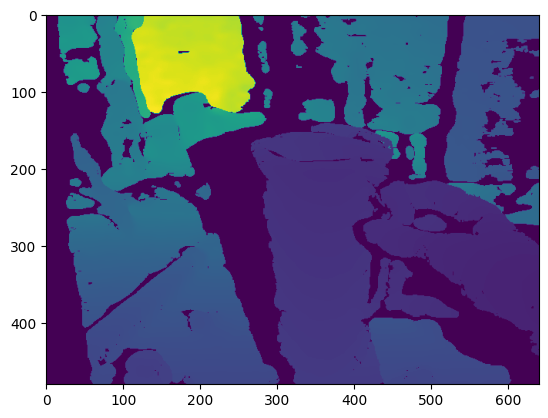

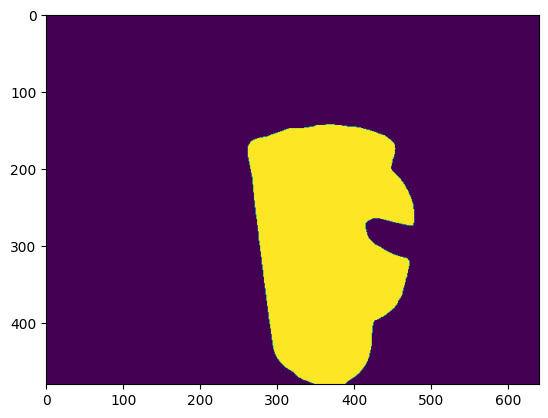

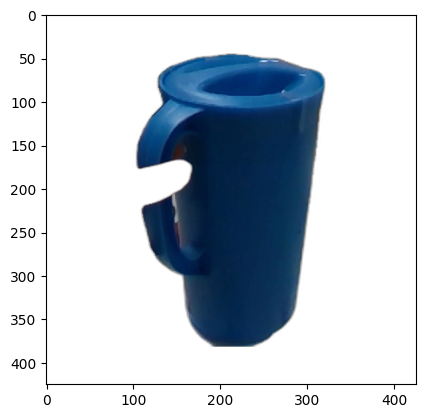

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/AP14/6_views.png


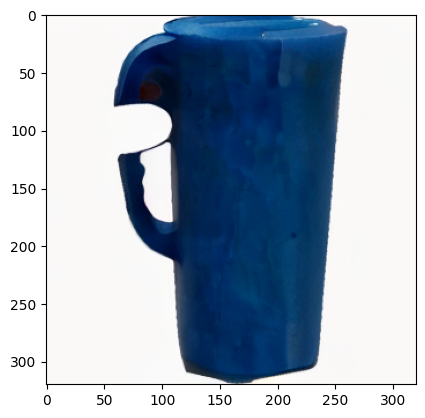

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/AP14/mesh.obj

Processing folder: MPM10

[[614.627   0.    320.262]
 [  0.    614.101 238.469]
 [  0.      0.      1.   ]] 



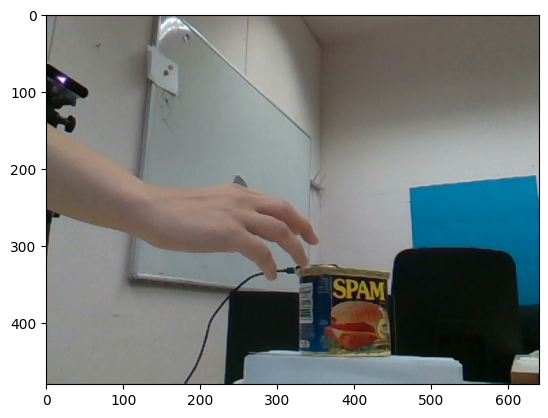

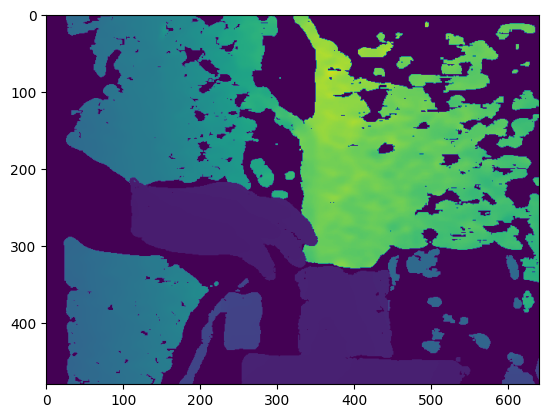

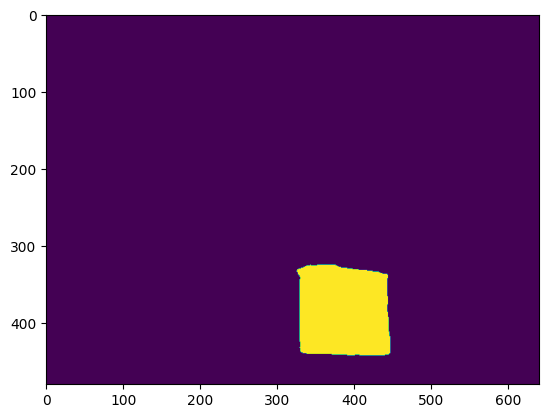

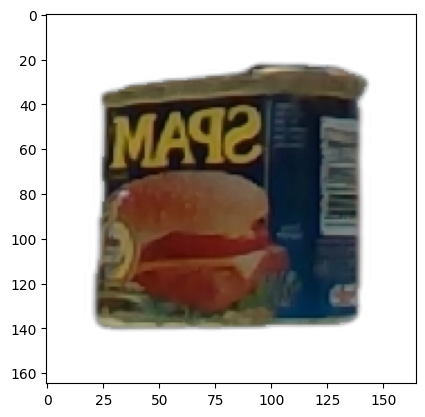

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/MPM10/6_views.png


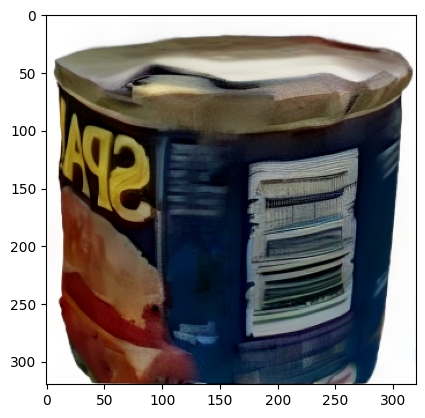

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/MPM10/mesh.obj

Processing folder: MPM11

[[617.287   0.    314.564]
 [  0.    617.061 236.353]
 [  0.      0.      1.   ]] 



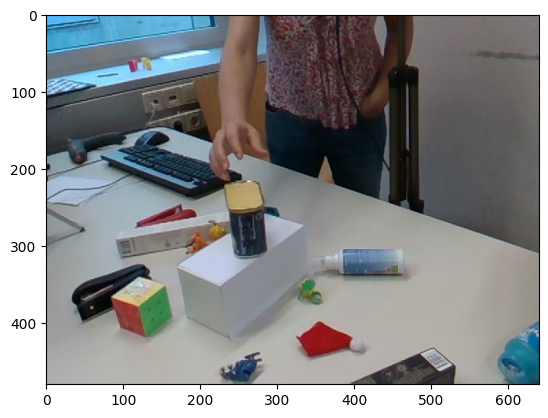

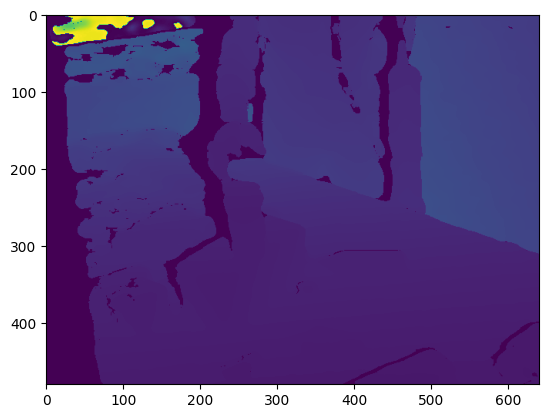

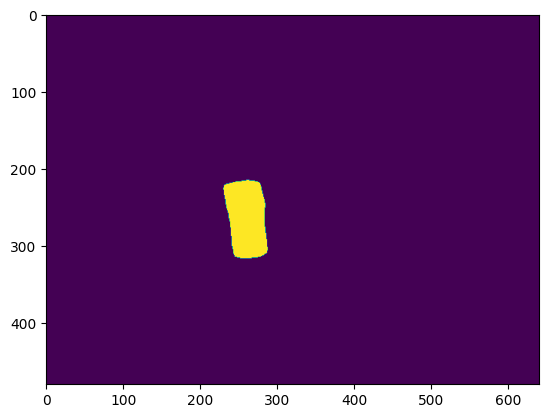

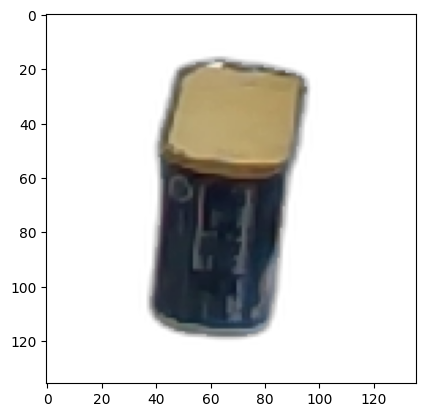

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/MPM11/6_views.png


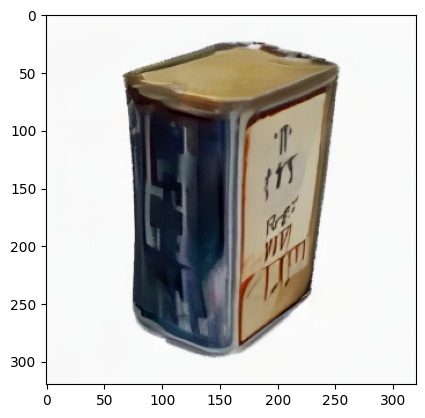

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/MPM11/mesh.obj

Processing folder: MPM12

[[615.411   0.    310.501]
 [  0.    614.584 238.798]
 [  0.      0.      1.   ]] 



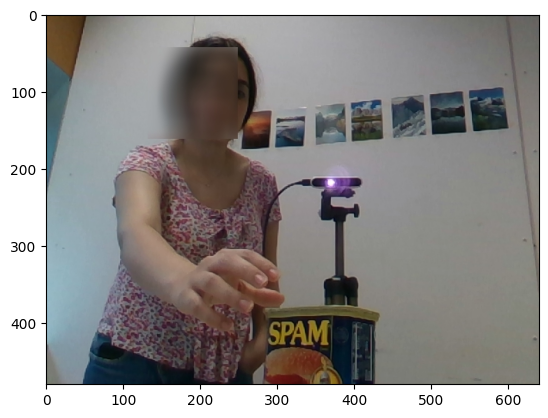

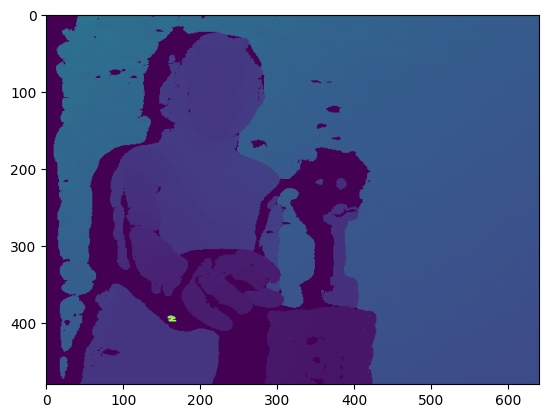

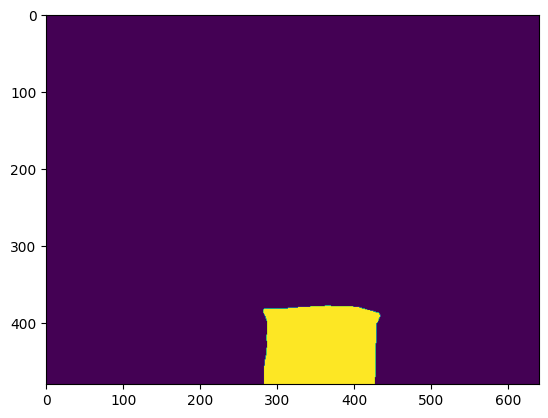

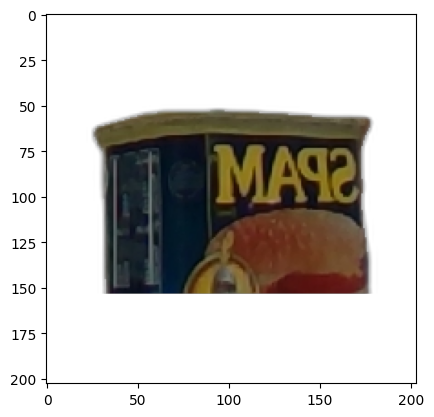

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/MPM12/6_views.png


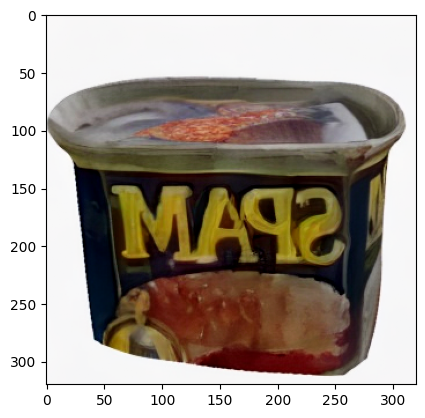

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/MPM12/mesh.obj

Processing folder: MPM13

[[615.635   0.    332.178]
 [  0.    615.31  231.754]
 [  0.      0.      1.   ]] 



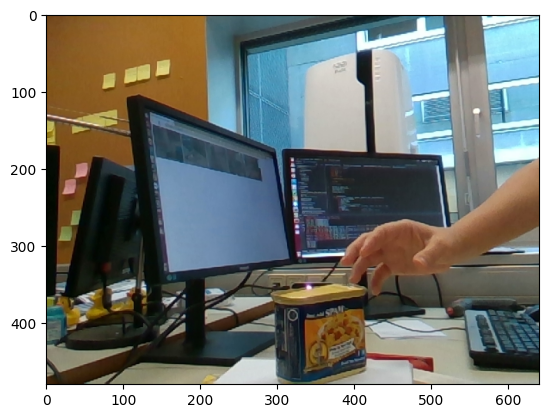

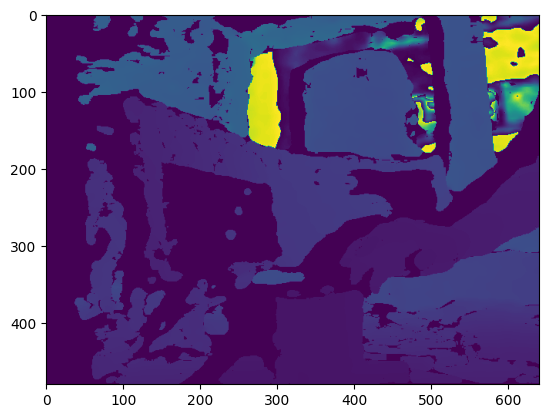

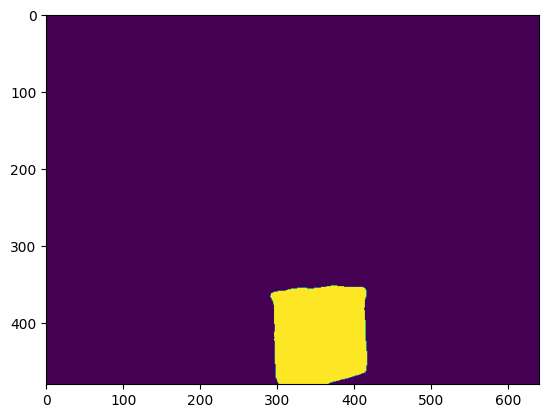

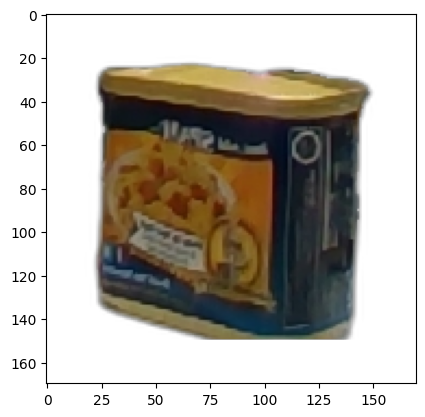

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/MPM13/6_views.png


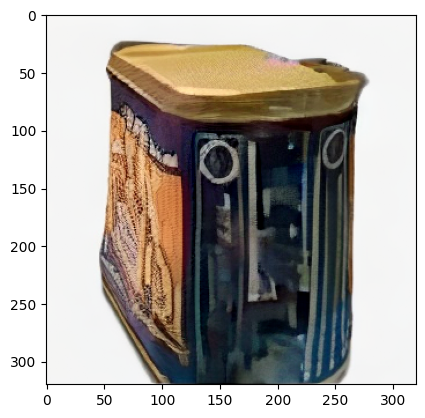

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/MPM13/mesh.obj

Processing folder: MPM14

[[617.042   0.    315.726]
 [  0.    616.693 245.485]
 [  0.      0.      1.   ]] 



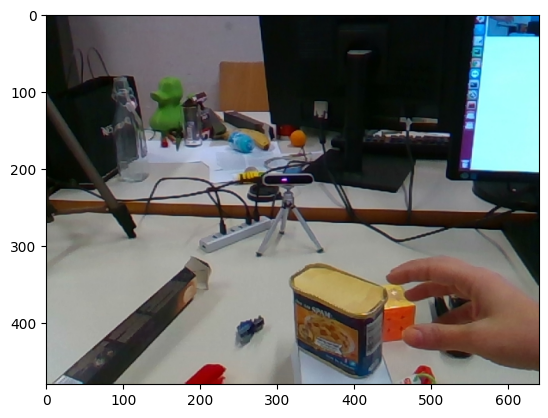

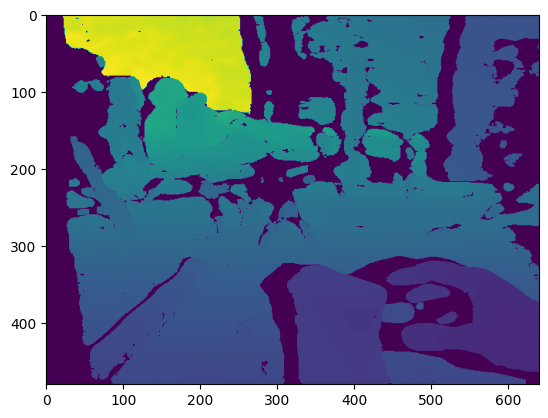

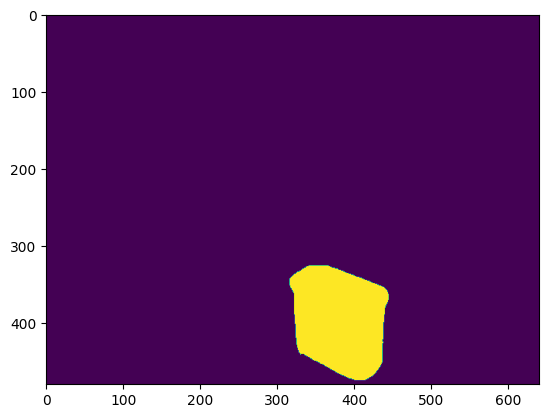

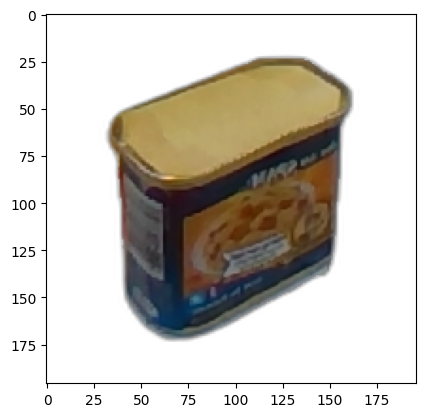

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/MPM14/6_views.png


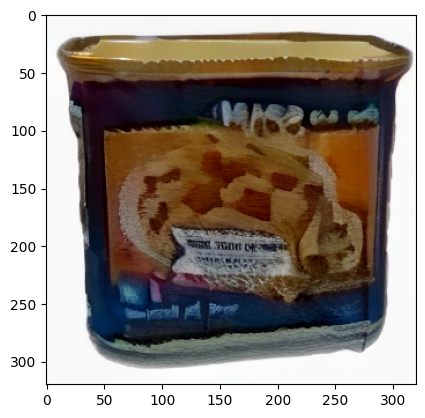

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/MPM14/mesh.obj

Processing folder: SB11

[[617.287   0.    314.564]
 [  0.    617.061 236.353]
 [  0.      0.      1.   ]] 



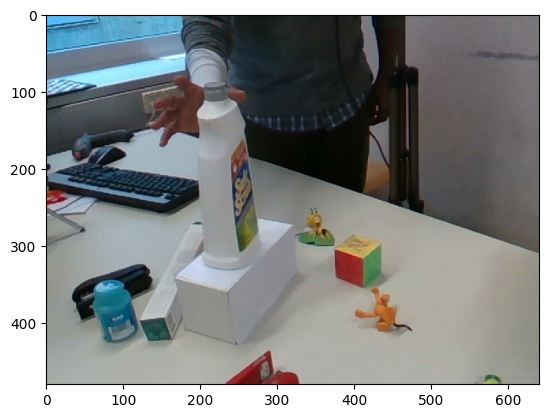

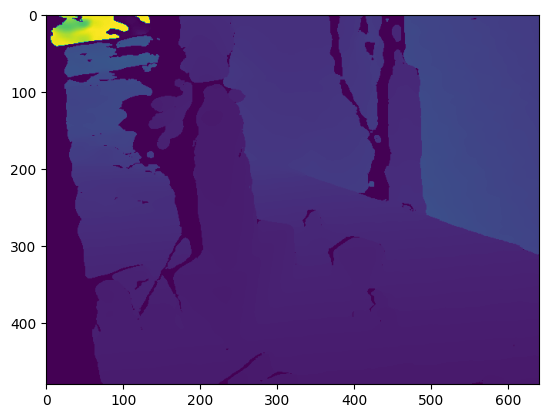

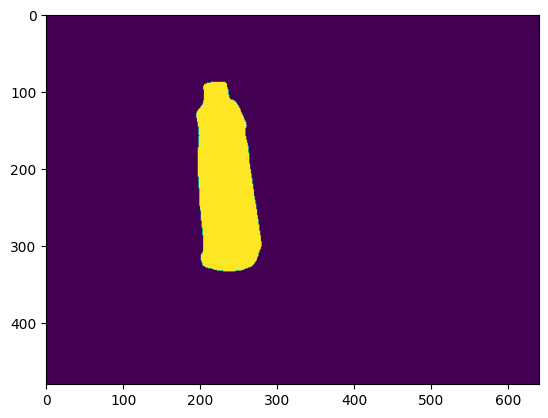

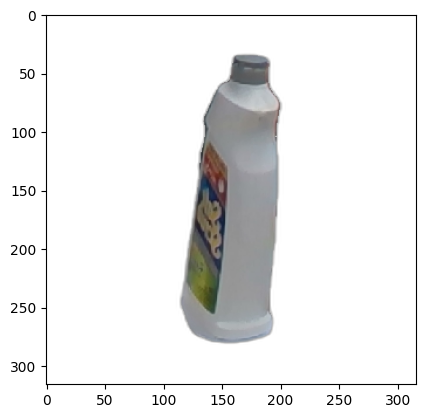

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/SB11/6_views.png


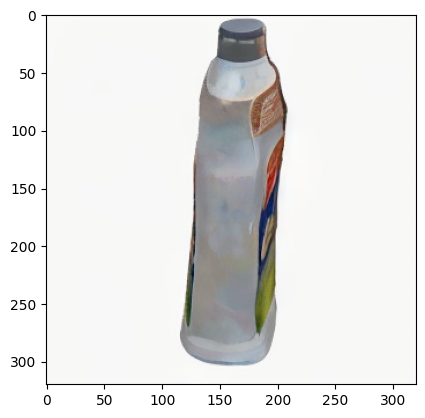

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/SB11/mesh.obj

Processing folder: SB13

[[615.635   0.    332.178]
 [  0.    615.31  231.754]
 [  0.      0.      1.   ]] 



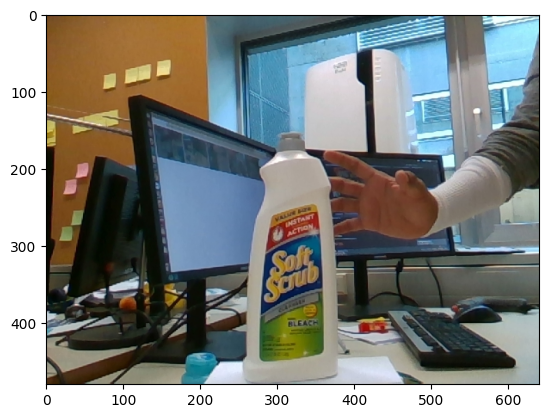

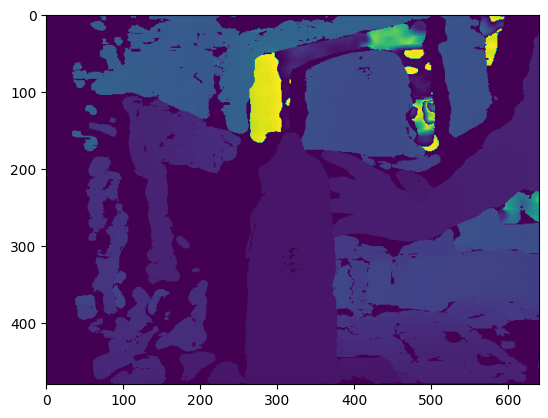

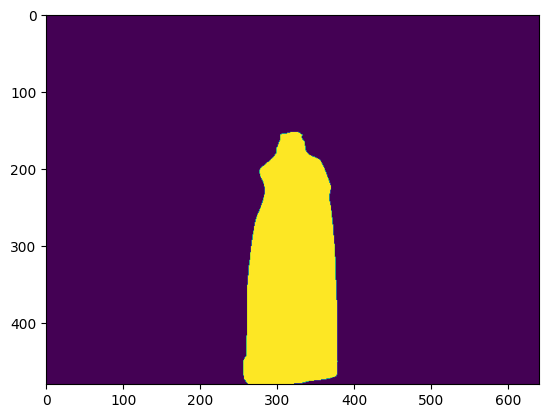

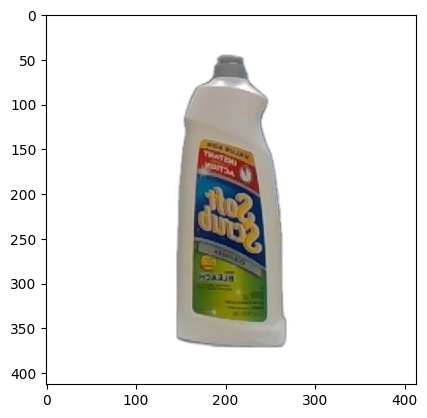

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/SB13/6_views.png


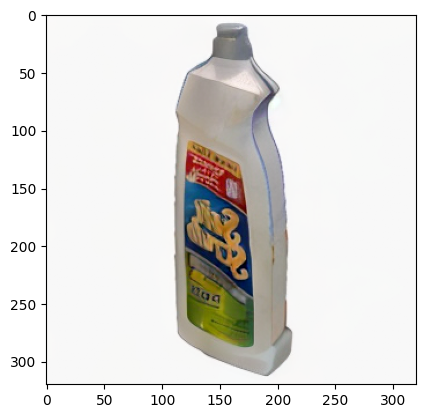

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/SB13/mesh.obj

Processing folder: SM1

[[617.343   0.    312.42 ]
 [  0.    617.343 241.42 ]
 [  0.      0.      1.   ]] 



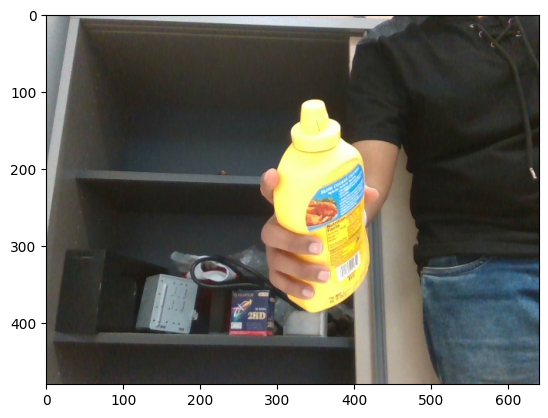

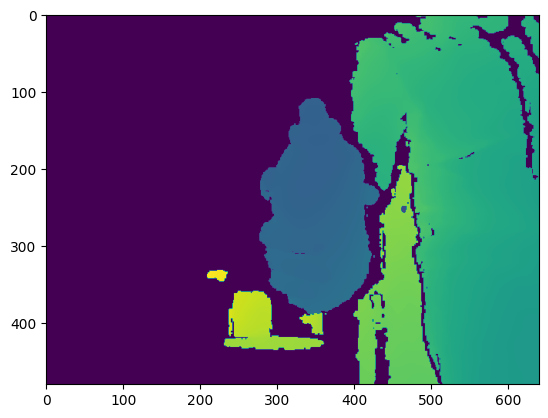

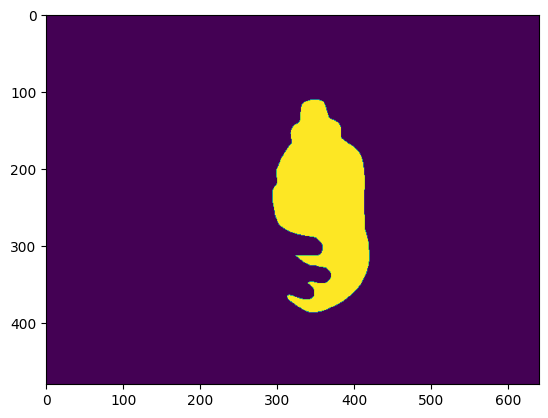

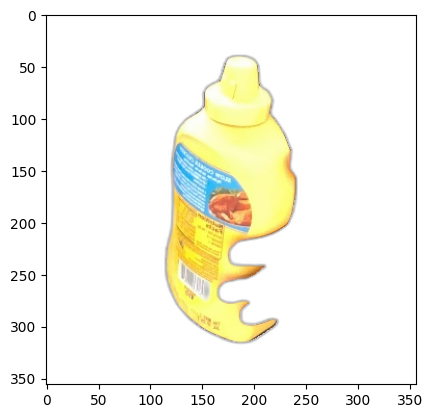

  0%|          | 0/75 [00:00<?, ?it/s]

Image saved to make_instantmeshes/SM1/6_views.png


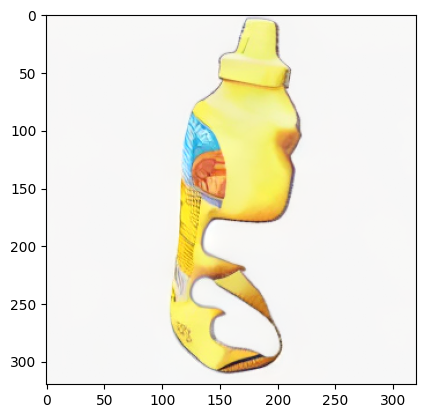

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['encoder.layer.0.adaLN_modulation.1.bias', 'encoder.layer.0.adaLN_modulation.1.weight', 'encoder.layer.1.adaLN_modulation.1.bias', 'encoder.layer.1.adaLN_modulation.1.weight', 'encoder.layer.10.adaLN_modulation.1.bias', 'encoder.layer.10.adaLN_modulation.1.weight', 'encoder.layer.11.adaLN_modulation.1.bias', 'encoder.layer.11.adaLN_modulation.1.weight', 'encoder.layer.2.adaLN_modulation.1.bias', 'encoder.layer.2.adaLN_modulation.1.weight', 'encoder.layer.3.adaLN_modulation.1.bias', 'encoder.layer.3.adaLN_modulation.1.weight', 'encoder.layer.4.adaLN_modulation.1.bias', 'encoder.layer.4.adaLN_modulation.1.weight', 'encoder.layer.5.adaLN_modulation.1.bias', 'encoder.layer.5.adaLN_modulation.1.weight', 'encoder.layer.6.adaLN_modulation.1.bias', 'encoder.layer.6.adaLN_modulation.1.weight', 'encoder.layer.7.adaLN_modulation.1.bias', 'encoder.layer.7.adaLN_modulation.1.w

Mesh saved to make_instantmeshes/SM1/mesh.obj


In [99]:
base_dir = 'make_instantmeshes'
folders = [f for f in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, f))]
folders.sort()

for folder in folders[2:]:
    print(f"\nProcessing folder: {folder}\n")
    DIR = os.path.join('make_instantmeshes/', folder)
    meta_file = os.path.join(DIR, '0000.pkl')
    K = pickle.load(open(meta_file,'rb'))['camMat']
    print(K, '\n')

    color_files = glob.glob(f"{DIR}/0000.jpg")
    color = imageio.imread(color_files[0])[...,:3]

    depth_scale = 0.00012498664727900177
    depth = cv2.imread(f"{DIR}/0000.png", -1)
    depth = (depth[...,2]+depth[...,1]*256)*depth_scale

    mask = cv2.imread(f"{DIR}/00000.png", -1)

    plt.imshow(color)
    plt.show()
    plt.imshow(depth)
    plt.show()
    plt.imshow(mask)
    plt.show()

    cmin, rmin, cmax, rmax = get_bounding_box(mask).astype(np.int32)
    input_box = np.array([cmin, rmin, cmax, rmax])[None, :]
    mask_refine = running_sam_box(color, input_box)

    input_image = color.copy()
    input_image[mask == False] = [255, 255, 255]

    rembg_session = rembg.new_session()
    input_image = remove_background(Image.fromarray(input_image), rembg_session)

    input_image = input_image.transpose(Image.FLIP_LEFT_RIGHT)

    input_image = resize_foreground(input_image.convert("RGBA"), 0.80)

    plt.imshow(input_image)
    plt.show()

    output_image = multiview_diffusion_model(input_image, num_inference_steps=75, ).images[0]
    output_image.save(os.path.join(DIR, f'6_views.png'))
    print(f"Image saved to {os.path.join(DIR, f'6_views.png')}")

    images = np.asarray(output_image, dtype=np.float32) / 255.0
    images = torch.from_numpy(images).permute(2, 0, 1).contiguous().float()  # (3, 960, 640)
    images = rearrange(images, 'c (n h) (m w) -> (n m) c h w', n=3, m=2)  # (6, 3, 320, 320)

    plt.imshow(images[0].permute(1,2,0).cpu().numpy())
    plt.show()

    IS_FLEXICUBES = True

    instant_mesh = instantiate_from_config(config.model_config)
    model_ckpt_path = config.infer_config.model_path
    state_dict = torch.load(model_ckpt_path, weights_only=True)['state_dict']
    state_dict = {k[14:]: v for k, v in state_dict.items() if k.startswith('lrm_generator.')}
    instant_mesh.load_state_dict(state_dict, strict=True)

    instant_mesh = instant_mesh.to(device)
    instant_mesh.init_flexicubes_geometry(device, fovy=30.0)
    instant_mesh = instant_mesh.eval()

    images = images.unsqueeze(0).to(device)
    images = torchvision.transforms.functional.resize(images, 320, interpolation=3, antialias=True).clamp(0, 1)

    input_cameras = get_zero123plus_input_cameras(batch_size=1, radius=4.0 * 1.0).to(device)
    chunk_size = 5 if IS_FLEXICUBES else 1
    with torch.no_grad():
        planes = instant_mesh.forward_planes(images, input_cameras)
        mesh_path_idx = os.path.join(DIR, f'mesh.obj')

        mesh_out = instant_mesh.extract_mesh(planes, use_texture_map=False, **config.infer_config, )
        vertices, faces, vertex_colors = mesh_out
        save_obj(vertices, faces, vertex_colors, mesh_path_idx)
        print(f"Mesh saved to {mesh_path_idx}")

    del instant_mesh

In [100]:
mesh = trimesh.load(os.path.join(DIR, f'mesh.obj'))
mesh.show(viewer='notebook')

In [101]:
del multiview_diffusion_model
torch.cuda.empty_cache()  # Clear the GPU memory